# Problem 1: Conjugate Inference

In the following we will implement, from scratch, two Bayesian conjugate inference problems. 

In ``R``, there are in-built ``R`` functions to sample from and evaluate the density function of many standard distributions. For this particular problem we assume that the in-built functions to evaluate the density don't exist and implement them from scratch! When required, however, we will use the in-built sampling functions.

If you are unable to load a package (e.g. ``library("MASS")``), remember to install the required library ``install.packages()`` (e.g. ``install.packages("MASS")``).

### Notation:

Throughout this notebook and other notebooks we will use the following standardised notation:

- Data or observations will be represented as lower-case variables (e.g. $y_i$) and in-code as ``y_i`` and a collection of $n$ data will be denoted as a vector (or matrix) $\underline{y} = (y_i)_{i=1}^n = (y_1,\ldots,y_n)^\top$ and in-code as ``y``. Note that $\underline{y}$ will be a vector when each observation $x_i$ is a one-dimensional number and a matrix when each observation $x_i$ is a vector. This distinction will become apparent in this notebook. 
- Data $y_i$ are assumed to be a realisation from a corresponding random-variable $Y_i$. Random variables will be denote by a capital letters (e.g. $Y_i$).
- Probability distributions come equipped with parameters. Individual parameters will usually be denoted by lower-case letters (e.g. $p$) or Greek letters (e.g. $\mu$). We will group all parameters together as a vector $\theta = (\theta_1,\ldots,\theta_m)$, where each $\theta_1,\ldots,\theta_m$ is a parameter. For example, the mean $\mu$ and variance $\sigma^2$ parameterise a normal distribution $\mathcal{N}(\mu,\sigma^2)$ and thus we write $\theta = (\mu, \sigma^2)$.

### Notebook settings

The following changes the default plot size for the notebook:

In [1]:
options(repr.plot.width = 4, repr.plot.height = 2.5)

### Loading Libraries

The following loads the required packages to run all the code in this notebook:

In [3]:
# install.packages(c("ggplot2", "cowplot"))
# install.packages("plotly")
# install.packages(c("tidyverse", "magrittr", "MASS", "emulator"))

library(ggplot2)
library(cowplot)
library(plotly)
library(tidyverse)
library(magrittr)
library(MASS)
library(emulator)


## Subproblem 1: Full Inference for the Normal distribution

From the lectures, you may have encountered the problem of inferring the mean $\mu$ of a Normal distribution $\mathcal{N}(\mu,\sigma^2)$, with known variance $\sigma^2$. Our first sub-problem is consider the case when the variance $\sigma^2$ is also to be inferred.

### Data Generation

For this problem we will use artificial data. That is, we will select the "true" $\mu$ and $\sigma^2$ ourselves and generate data using this distribution. 

This has the advantage of us being able to determine if our inference is working, since we have knowledge of the true value of the parameter in advance.

 Let us pick $\mu = -19$ and $\sigma^2 = 0.1$ and suppose we generate $50$ data points, $\underline{y} = (y_1,\ldots,y_{50})$, according to the distribution $\mathcal{N}(-19,0.1)$. That is, the $y_i$'s are realisations (or observations) from IID random variables $Y_i \sim \mathcal{N}(-19,0.1)$.

 We will use the inbuilt ``R`` sampler ``rnorm``. The ``R`` function ``rnorm`` requires the standard deviation, so in the following we square root the variance:


In [107]:
true_mean <- -19
true_variance <- 0.2
n <- 50 # number of data points

y_data <- rnorm(n, mean = true_mean, sd = true_variance ** 0.5)
print(y_data)

 [1] -18.99279 -18.20280 -18.68587 -18.67586 -19.25201 -19.19093 -19.03010
 [8] -18.23686 -19.53479 -18.76065 -19.28407 -19.94554 -19.17187 -18.75643
[15] -19.08659 -18.67171 -18.85639 -19.41002 -19.83230 -18.70561 -18.53674
[22] -19.50776 -19.96844 -19.51422 -18.41872 -19.32360 -19.00502 -19.22999
[29] -19.11500 -18.84015 -19.98211 -18.81222 -19.53284 -19.82722 -18.89968
[36] -19.46485 -19.40288 -19.08609 -19.25926 -19.51104 -19.09641 -19.30696
[43] -19.80799 -19.26592 -18.94783 -19.13615 -18.94871 -18.87507 -17.92389
[50] -18.46669


### Defining the Probability Model

Recall that we assume the data is generated according to the normal distribution, with unknown mean $\mu$ and unknown variance $\sigma^2$. That is, $Y_i | \mu, \sigma^2 \sim \mathcal{N}(\mu,\sigma^2)$. Thus our parameters are of the form $\theta = (\mu, \sigma^2)$. 

Assuming IID observations, each observation random variable $Y_i$ has associated density function:

$$ p(y_i | \mu, \sigma^2) = \frac{1}{\sigma \sqrt{2\pi}} \exp\left\{-\frac{1}{2}\left(\frac{y_i-\mu}{\sigma}\right)^2\right\}.$$

(Note: We can also write $p(y_i | \mu, \sigma^2)$ as $p(y_i | \theta)$)

There are many ways to implement this in ``R``. A naive way of implementing the model is to define the normal density as an ``R`` function:

In [108]:
naive_dnorm <- function(y_i, mean, variance) {
    const <- 1 / (sqrt(variance) * (2 * pi) ** 0.5) # pi is a built-in constant
    exponential <- exp(- 0.5 * ((y_i - mean) / sqrt(variance)) ** 2)
    output <- const * exponential
    return(output)
}

In [109]:
naive_dnorm(-0.2, 0, 3)

[1] 0.228799

Recalling the Bayes formula for probability densities, 

$$ p(\theta|\underline{y}) = \frac{p(\underline{y}|\theta) p(\theta)}{\int p(\underline{y}|\theta) p(\theta)\,\mathrm{d}\theta}, $$

where the likelihood takes the form

$$ p(\underline{y}|\theta) = \prod_{i=1}^n p(y_i | \theta), $$

from a computational perspective, why is implementing the normal density naive?

We should always implement the log-density instead:

$$ \log p(y_i | \mu, \sigma^2) = -\log(\sigma\sqrt{2\pi}) - \frac{1}{2}\left(\frac{y_i-\mu}{\sigma}\right)^2.$$

In [110]:
matthews_dnorm <- function(y_i, mean, variance, log = FALSE) {
    const <- -0.5 * log(variance) - 0.5 * log(2 * pi)
    exp_term <- - 0.5 * ((y_i - mean) ** 2) / variance
    output <- const + exp_term
    if (log == TRUE) {
        return(output)
    }
    else{
        return(exp(output))
    }
}

In [111]:
print(matthews_dnorm(-0.2, 0, 3))
print(dnorm(-0.2, 0, sqrt(3)))

[1] 0.228799
[1] 0.228799


#### Plotting the density function with ``ggplot``

Let's plot this to make sure we have done this correctly.

To do this we generate a mesh and evaluate the normal density on the mesh, and plot the resulting points:

In [112]:
mesh <- seq(1, 5, length.out = 400) # define mesh
normal_eval <- matthews_dnorm(mesh, 3, 0.4 ** 2) # mean = 3, variance = 0.16

In these notebooks, we will use the library ``ggplot`` for plotting, because it looks nice! Depending on your ``R`` version, you may have ``ggplot`` or ``ggplot2`` installed.

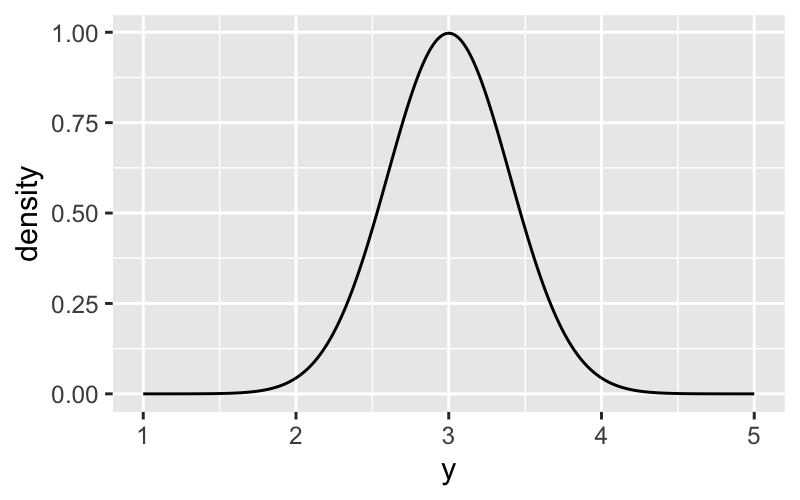

In [113]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 200)

library(ggplot2)

gg_plot_df <- data.frame(y = mesh, density = normal_eval)

normal_density_plot <- ggplot(gg_plot_df, aes(x = y, y = density)) +
                       geom_line()
normal_density_plot

#### Defining the full likelihood

So far, we have only defined the density function of one data! What about the probability of observing all the data? Recalling that we assume IID data, the *likelihood function* of all our observations $\underline{y} = (y_1,\ldots,y_{n})$ is:

$$ p(\underline{y}|\theta) = \prod_{i=1}^{n} p(y_i|\theta).$$

Recalling that we try to always implement density functions as log-density functions, we really want the *log-likelihood*:

$$ \log \left(p(\underline{y}|\theta)\right) = \sum_{i=1}^{n} \log \left(p(y_i|\theta) \right).$$

Using our previous code, we can implement this really easily:


In [114]:
dlikelihood <- function(mean, variance, y, log = FALSE) {
    log_pdf_evals <- matthews_dnorm(y, mean, variance, log = TRUE)
    output <- sum(log_pdf_evals)

    if (log == TRUE) {
        return(output)
    }
    else{
        return(exp(output))
    }
}

# The following function allows us to evaluate the log-likelihood for
# many mean and variance pairs at one. This is achieved by repeatedly
# applying log_likelihood_normal on each (mean, standard_deviation) pair.
# We use the apply() function, you could also just use a for-loop.


dlikelihood_vectorised <- function(mean, variance, y, log = FALSE) {
    theta <- matrix(c(mean, variance), ncol = 2)
    output <- apply(theta, 1, function(theta) dlikelihood(theta[1], theta[2], y, log = log))
    return(output)
}

### Defining the Prior

In order to perform conjugate inference, we require a conjugate prior for the mean $\mu$ and variance $\sigma^2$. How do we determine an appropriate conjugate prior?

We can try to pick different priors, work out the math each time and hope for the best, or we can take a visit to the [Distribution Zoo](https://ben18785.shinyapps.io/distribution-zoo/) (or [Wikipedia](https://en.wikipedia.org/wiki/Conjugate_prior\#Table\_of\_conjugate\_distributions)).

#### Implementing the Normal Inverse Gamma distribution

It turns out that a conjugate prior is the [Normal Inverse Gamma distribution](https://en.wikipedia.org/wiki/Normal-inverse-gamma_distribution), and we write $\theta \sim \text{NormalInverseGamma}(\eta, \lambda, \alpha, \beta)$. The parameters $\eta$ and $\lambda$ are the *location* and *scale* parameters respectfully. The parameters $\alpha$ and $\beta$ are *shape* parameters.

The density function $p(\theta|\eta, \lambda, \alpha, \beta)$ takes the form:

$$ p(\theta | \eta, \lambda, \alpha, \beta ) = \frac{\sqrt{\lambda}}{\sigma \sqrt{2\pi}} \frac{\beta^\alpha}{\Gamma(\alpha)} \left(\frac{1}{\sigma^2}\right)^{\alpha+1} \exp\left\{-\frac{2\beta + \lambda (\mu - \eta)^2}{2\sigma^2}\right\}. $$

Remember that $\theta = (\mu, \sigma^2)$ and so the $\mu$ and $\sigma$ terms above are the inputs of the density function, and the other variables $\eta, \lambda, \alpha$ and $\beta$  are the parameters which control the distribution. Here $\Gamma$ is the Gamma function, which you may be familiar with (e.g. from the Gamma distribution).

This is pretty annoying to implement due to the number of parameters and long formula. Most of the time, there will be some ``R`` package out there that provides an implementation of whatever you require. After a quick Google, it appears that ``PIGShift`` provides an implementation. WARNING: Some ``CRAN`` code may be buggy and not work. We will ignore other implementations, since we are doing everything from scratch. 

Recall we try to implement everything as a log densities:

$$ \log p(\theta | \eta, \lambda, \alpha, \beta ) = \log\left(\frac{\sqrt{\lambda}}{\sigma \sqrt{2\pi}}\right) +\log\left(\frac{\beta^\alpha}{\Gamma(\alpha)}\right) +\log \left\{\left(\frac{1}{\sigma^2}\right)^{\alpha+1}\right\} -\frac{2\beta + \lambda (\mu - \eta)^2}{2\sigma^2}. $$

Note that we can further simplify this. This is implicitly done in the code below, check this for yourself.

Since $\theta = (\mu, \sigma^2)$ is two-dimensional, we need to deal with multidimensional input. This is quite simple in two dimensions, since we can just add an extra argument to our function. However, things are more challenging in higher dimensions. In the following, the ``R`` variable ``parameters`` is a list of the Normal Inverse Gamma parameters $(\eta, \lambda, \alpha, \beta)$.

In [115]:
dprior <- function(mean, variance, prior_params, log = FALSE) {
    eta <- prior_params$eta # assign each parameter from the list
    lambda <- prior_params$lambda
    alpha <- prior_params$alpha
    beta <- prior_params$beta

    constant <- 0.5 * log(lambda) - 0.5 * log(2 * pi) + alpha * log(beta) - lgamma(alpha)
    sigma_term <- - 0.5 * log(variance) - (alpha + 1) * log(variance)
    exp_term <- - (2 * beta + lambda * (eta - mean) ** 2) / (2 * variance)

    output <- constant + sigma_term + exp_term
    if (log == TRUE) {
      return(output)
    }
    else {
      return(exp(output))
    }
}

In [116]:
dprior(1, 1, list(eta = 1, lambda = 2, alpha = 3, beta = 4))

[1] 0.3306718

#### Plotting the Prior Density

There are many different ways to plot 2D functions. For example, you could use contour plots or surface plots. There are many different implementation approaches in ``R`` too. 

The following plots a contour plot using the ``R`` package ``tidyverse``. This is probably the simplest approach in terms of complexity of code.

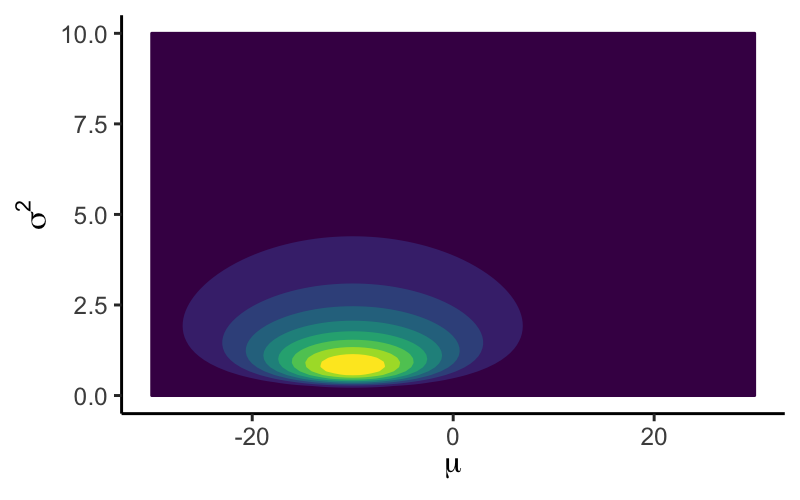

In [118]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 200)

# install.packages("tidyverse")
library(tidyverse)

prior_params <- list(eta = -10, lambda = 1 / 50, alpha = 1, beta = 2)
prior_pdf <- function(mu, sigma) dprior(mu, sigma, prior_params)
 
mu_mesh <- seq(-30, 30, length.out = 100)
sigma_mesh <- seq(0, 10, length.out = 100)

z <- outer(mu_mesh, sigma_mesh, dprior, prior_params)
z <- replace(z, is.na(z), 0)

rownames(z) <- mu_mesh
colnames(z) <- sigma_mesh

as.data.frame(z) %>% # these %>% are "pipes" from the package magrittr
  rownames_to_column(var = "row") %>% # they allow you to compose functions 
  gather(col, value, -row) %>% 
  mutate(row = as.numeric(row),
         col = as.numeric(col)) %>%
ggplot(aes(row, col, z = value, color = after_stat(level))) +
  geom_contour_filled(bins = 10, show.legend = FALSE) +
   theme_classic() + xlab(expression(mu)) + ylab(expression(sigma^2))

Unfortunately ``ggplot`` does not support 3D surface plots. In order to plot a surface plot, let's use the library ``plotly`` instead.

The following libraries ``htmlwidgets`` and ``IRdisplay`` are used to display the interactive ``plotly`` plot in html. 

In [119]:
library(plotly)

library(htmlwidgets)
library('IRdisplay')

prior_figure <- plot_ly(x = mu_mesh, y = sigma_mesh, z = z) %>% add_surface()
prior_figure

# htmlwidgets::saveWidget(prior_figure, "figures/prior_figure.html")
# display_html('<iframe src="figures/prior_figure.html" width=100% height=400></iframe>')


HTML widgets cannot be represented in plain text (need html)

### The Bayesian Update

Since we are in the conjugate setting, we already know that the posterior will also follow a Normal Inverse Gamma distribution. The only thing we need to know is how the parameters $\eta,\lambda,\alpha$ and $\beta$ are updated. We will do this soon, but for now, let us use Bayes formula and evaluate the unnormalised posterior density.

#### Unnormalised Posterior Density

Since we want to evaluate the unnormalised posterior at many parameter values at once, we use the ``log_likelihood_normal_vectorised`` function from before.

In [120]:
dposterior_unnormalised <- function(mean, variance, y_data, prior_params, log = FALSE) {
    log_prior <- dprior(mean, variance, prior_params, log = TRUE)
    log_likelihood <- dlikelihood_vectorised(mean, variance, y_data, log = TRUE)
    output <- log_prior + log_likelihood
    if (log == TRUE) {
        return(output)
    }
    else{
        return(exp(output))
    }
}

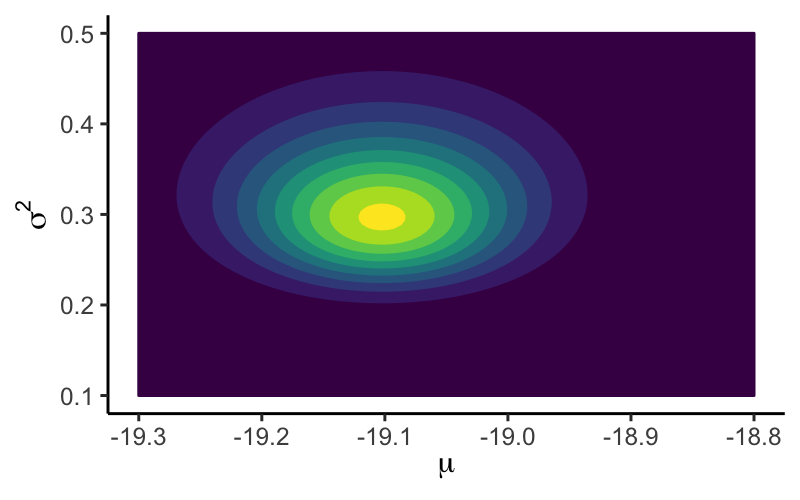

In [123]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 200)

prior_params <- list(eta = -10, lambda = 1 / 50, alpha = 1, beta = 2)

mu_mesh <- seq(-19.3, -18.8, length.out = 100)
sigma_mesh <- seq(0.1, 0.5, length.out = 100)

z <- outer(mu_mesh, sigma_mesh, dposterior_unnormalised, y_data, prior_params)
z <- replace(z, is.na(z), 0)

rownames(z) <- mu_mesh
colnames(z) <- sigma_mesh

as.data.frame(z) %>% # these %>% are "pipes" from the package magrittr
  rownames_to_column(var = "row") %>% # they allow you to compose functions
  gather(col, value, -row) %>%
  mutate(row = as.numeric(row),
         col = as.numeric(col)) %>%
ggplot(aes(row, col, z = value, color = after_stat(level))) +
  geom_contour_filled(bins = 10, show.legend = FALSE) +
   theme_classic() + xlab(expression(mu)) + ylab(expression(sigma^2))

#### Normalised Posterior Density

Since we are in the conjugate setting, the posterior density is also be Normal Inverse Gamma and so we can just update the parameters with their posterior values. From Wikipedia, $\theta | \underline{y} \sim \text{NormalInverseGamma}(\eta', \lambda', \alpha', \beta')$, where

$$ \eta' = \frac{\lambda \eta + n\bar{y}}{\lambda + n} $$
$$ \lambda' = \lambda + n $$
$$ \alpha' = \alpha + n/2 $$
$$ \beta' = \beta + \frac{1}{2}\sum_{i=1}^n (y_i - \bar{y})^2 + \left( \frac{n\lambda}{\lambda + n} \right) \left(\frac{(\bar{y} - \eta)^2}{2}\right) $$


Here, $n = 50$ is the number of data points and $\bar{y} = \frac{1}{50}\sum_{i=1}^{50}y_i$ is the mean of the data.

Let's implement this posterior update in a nice clean function:

In [124]:
dposterior <- function(mean, variance, y_data, prior_params, log = FALSE) {
    eta <- prior_params$eta # assign each parameter from the list
    lambda <- prior_params$lambda
    alpha <- prior_params$alpha
    beta <- prior_params$beta

    mean_y_data <- mean(y_data)
    n <- length(y_data) # n = 50

    eta_updated <- (lambda * eta + n * mean_y_data) / (lambda + n)
    lambda_updated <- lambda + n
    alpha_updated <- alpha + n / 2
    beta_updated <- beta + 0.5 * sum((y_data - mean_y_data) ** 2) + (n * lambda / (lambda + n)) * ((mean_y_data - eta) ** 2 ) / 2

    posterior_params <- list(eta = eta_updated, lambda = lambda_updated, alpha = alpha_updated, beta = beta_updated)

    output <- dprior(mean, variance, posterior_params, log = log)
    return(output)
}

Plotting the normalised posterior:

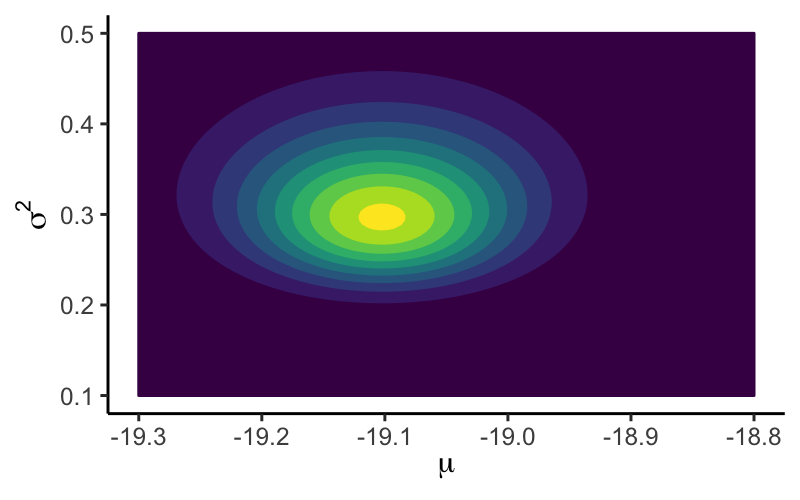

In [125]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 200)

# install.packages("tidyverse")
library(tidyverse)
 
mu_mesh <- seq(-19.3, -18.8, length.out = 100)
sigma_mesh <- seq(0.1, 0.5, length.out = 100)

z_posterior <- outer(mu_mesh, sigma_mesh, dposterior, y_data, prior_params)
z_posterior <- replace(z, is.na(z), 0)

rownames(z_posterior) <- mu_mesh
colnames(z_posterior) <- sigma_mesh

as.data.frame(z_posterior) %>% # these %>% are "pipes" from the package magrittr
  rownames_to_column(var = "row") %>% # they allow you to compose functions
  gather(col, value, -row) %>%
  mutate(row = as.numeric(row),
         col = as.numeric(col)) %>%
ggplot(aes(row, col, z = value, color = after_stat(level))) +
  geom_contour_filled(bins = 10, show.legend = FALSE) +
   theme_classic() + xlab(expression(mu)) + ylab(expression(sigma^2))

#### Plotting the Likelihood, Prior and Posterior

In order to explore the how the likelihood, prior and posterior vary according to the number of data $n$ used and the choice of prior parameters, let's plot each of the plots side by side. In order to do this, we will use the package ``plotly``.

Let's first generate new data and pick prior parameters:

In [126]:
true_mean <- 5
true_variance <- 1.5
n <- 20 # number of data points

y_data <- rnorm(n, mean = true_mean, sd = true_variance ** 0.5)

prior_params <- list(eta = 3, lambda = 4, alpha = 1, beta = 2)

print(y_data)

 [1] 5.506648 4.772467 4.499889 5.358546 4.809483 4.459357 4.941129 5.775838
 [9] 5.580353 4.109014 8.748430 5.169809 4.985515 7.446607 4.269823 5.428655
[17] 6.063350 6.202099 3.056373 4.475485


Let's plot the likelihood, prior and posterior with ``plotly``:

In [127]:
options(warn = -1)

mean_mesh <- seq(true_mean - 2.5, true_mean + 2.5, length.out = 50)
variance_mesh <- seq(0.01, true_variance + 2.5, length.out = 50)

z_likelihood <- outer(mean_mesh, variance_mesh, dlikelihood_vectorised, y_data)
z_true_likelihood <- dlikelihood(true_mean, true_variance, y_data)
z_prior <- outer(mean_mesh, variance_mesh, dprior, prior_params)
z_posterior <- outer(mean_mesh, variance_mesh, dposterior, y_data, prior_params)

mean_axis <- list(
  title = "mean",
  gridcolor = 'rgb(255, 255, 255)',
  zerolinecolor = 'rgb(255, 255, 255)',
  showbackground = TRUE,
  backgroundcolor = 'rgb(230, 230,230)'
)

variance_axis <- list(
  title = "variance",
  gridcolor = 'rgb(255, 255, 255)',
  zerolinecolor = 'rgb(255, 255, 255)',
  showbackground = TRUE,
  backgroundcolor = 'rgb(230, 230,230)'
)

z_axis <- list(
  title = "z",
  gridcolor = 'rgb(255, 255, 255)',
  zerolinecolor = 'rgb(255, 255, 255)',
  showbackground = TRUE,
  backgroundcolor = 'rgb(230, 230,230)'
)


fig_likelihood <- plot_ly(x = variance_mesh, y = mean_mesh, z = z_likelihood, scene = "scene1") %>%
                  add_surface()

fig_prior <- plot_ly(x = variance_mesh, y = mean_mesh, z = z_prior, scene = "scene2") %>% add_surface()
fig_posterior <- plot_ly(x = variance_mesh, y = mean_mesh, z = z_posterior, scene = "scene3") %>% add_surface()

fig <- subplot(fig_likelihood, fig_prior, fig_posterior, nrows = 1)
fig <- fig %>% layout(title = "Likelihood, Prior and Posterior",
         scene = list(domain = list(x = c(0, 0.33), y = c(0, 0.9)),
                      xaxis = variance_axis, yaxis = mean_axis, zaxis = z_axis,
                      aspectmode = 'cube'),
         scene2 = list(domain = list(x = c(0.33, 0.66), y = c(0, 0.9)),
                       xaxis = variance_axis, yaxis = mean_axis, zaxis = z_axis,
                       aspectmode = 'cube'),
         scene3 = list(domain = list(x = c(0.66, 1), y = c(0, 0.9)),
                       xaxis = variance_axis, yaxis = mean_axis, zaxis = z_axis,
                       aspectmode = 'cube'))

fig
# htmlwidgets::saveWidget(fig, "figures/like_prior_post.html")
# display_html('<iframe src="figures/like_prior_post.html" width=100% height=400></iframe>')

HTML widgets cannot be represented in plain text (need html)

#### The Normalisation Constant

Since we have both the normalised and unnormalised posteriors, we can obtain the normalisation constant. Recall Bayes formula: 

$$ p(\theta | \underline{y}) = \frac{p(\underline{y} | \theta) p(\theta)}{ \int_\Theta p(\underline{y} | \theta) p(\theta) \,\mathrm{d}\theta }. $$

The term in the denominator $\int_\Theta p(\underline{y} | \theta) p(\theta) \,\mathrm{d}\theta$ is called the *normalisation constant* because it is a constant term in $\theta$. Let's denote the normalisation constant as $C = \int_\Theta p(\underline{y} | \theta) p(\theta) \,\mathrm{d}\theta$.

Our function ``dposterior_unnormalised`` above computes the *unnormalised* posterior:

$$ \tilde{p}(\theta | \underline{y}) = p(\underline{y} | \theta) p(\theta). $$

Which is related to the *normalised* posterior through

$$ p(\theta | \underline{y}) = \frac{\tilde{p}(\theta | \underline{y})}{C}. $$

After some simple manipulations, we can obtain $C$ by evaluating:

$$ C =  \frac{\tilde{p}(\theta | \underline{y})}{p(\theta | \underline{y})}. $$

Let's try to implement this and check we are correct. Since we are dividing by a density function to compute $C$, it is better to implement everything on the log scale:

$$ \log(C) = \log(\tilde{p}(\theta | \underline{y})) - \log(p(\theta | \underline{y})).$$

In [128]:
evaluate_logC <- function(mean, variance, y_data, prior_params) {
    unnormalised_posterior <- dposterior_unnormalised(mean, variance, y_data, prior_params, log = TRUE)
    normalised_posterior <- dposterior(mean, variance, y_data, prior_params, log = TRUE)
    output <- unnormalised_posterior - normalised_posterior
    return(output)
}

evaluate_logC(c(-18, -19, 9), c(2, 2, 3), y_data, prior_params)

[1] -38.87031 -38.87031 -38.87031

## Subproblem 2: Mean Inference for a Bivariate Normal Model

The following example is intended to highlight the difference between the dimensionality of observations and the dimensionality of parameters, and the associated notation used. In the previous sub-problem, each of our observations were one-dimensional, but we had two parameters $\mu$ and $\sigma^2$ making the parameter $\theta = (\mu,\sigma^2)$ two-dimensional. In the following each of our observations are two-dimensional and our parameter is too:

We consider inference for the mean-vector of a bivariate Normal distribution (a 2-d multivariate normal distribution). We assume each of our observations $y_i$ are IID observations from a bivariate normal distribution 

$$ Y_i \sim \text{MultivariateNormal}(\underline{\mu}, \Sigma_{true}),$$

with unknown mean-vector $\underline{\mu} = (\mu_1, \mu_2)^\top$ and known covariance matrix $\Sigma_{true} = \begin{pmatrix} 2 & 1 \\ 1 & 2 \end{pmatrix}.$ Therefore, each observation $y_i = (y_i^{(1)}, y_i^{(2)})$ is a two-dimensional vector. All of our observations put together $\underline{y}$, is now a matrix:

$$ \underline{y} =  (y_1,\ldots,y_n)^\top  = \begin{pmatrix} y_1^{(1)} & y_1^{(2)} \\ y_2^{(1)} & y_2^{(2)} \\ \vdots & \vdots \\ y_n^{(1)} & y_n^{(2)} \end{pmatrix}.$$

Note the similarity with the previous subproblem, where each observation was one-dimensional:
$$ \underline{y} =  (y_1,\ldots,y_n)^\top  = \begin{pmatrix} y_1 \\ y_2 \\ \vdots \\ y_n\end{pmatrix}.$$

### Generating Data

Let's first generate artificial data. For this, we will use 

In [91]:
true_mean_vector <- c(2, 3)
true_cov_matrix <- matrix(c(2, 1, 1, 2), nrow = 2)

n_bvn_samples <- 30
y_bvn_data <- mvrnorm(n_bvn_samples, true_mean_vector, true_cov_matrix)

head(y_bvn_data, 5)

3.410117,5.488394
3.100495,3.807140
1.579780,5.500551
5.163959,6.756769
2.157724,4.239604


### The Bivariate Normal Distribution

The density function of a bivariate Normal distribution $Y = (Y^{(1)}, Y^{(2)}) \sim \text{MultivariateNormal}(\underline{\mu}, \Sigma)$ takes the form

$$ p(y | \underline{\mu}, \Sigma) = \frac{1}{\sqrt{(2\pi)^2 |\Sigma| }} \exp\left\{-\frac{1}{2}\left(y - \underline{\mu}\right)^\top \Sigma^{-1}\left(y - \underline{\mu}\right)\right\}, $$

where $y = (y^{(1)}, y^{(2)})^\top$ is a two-dimensional column vector and $|\Sigma|$ is the [determinant](https://en.wikipedia.org/wiki/Determinant) of the covariance matrix $\Sigma$. 

Let's first implement this as an ``R`` function. It is, again, best to implement this as a log density:

$$ \log p(y | \underline{\mu}, \Sigma) = -\log(2\pi) - \frac{1}{2}\log |\Sigma|  -\frac{1}{2}\left(y - \underline{\mu}\right)^\top \Sigma^{-1}\left(y - \underline{\mu}\right). $$

The ``R`` function ``solve`` computes the matrix inverse and the function ``det`` computes the matrix determinant. Although, since we are in 2D, we could instead have used the formulae for these.

The value ``quad_form`` computes the term $\left(y - \underline{\mu}\right)^\top \Sigma^{-1}\left(y - \underline{\mu}\right)$. The function ``quad.form(A, x)`` is from the ``emulator`` package and returns the quadratic form $x^\top {\bf A} x$. In the following code, we use the ``apply`` function to iteratively call ``quad.form`` for multiple given $y$ values. 

In [92]:
library(emulator)

matthews_dbvnorm <- function(y, mean_vector, cov_matrix, log = FALSE) {
    constant <- -log(2 * pi) - 0.5 * log(det(cov_matrix))
    inv_cov_matrix <- solve(cov_matrix)

    quad_form <- apply(t(y) - mean_vector, 2, function(y) quad.form(inv_cov_matrix, y))

    output <- constant - 0.5 * quad_form

    if (log == TRUE) {
        return(output)
    }
    else{
        return(exp(output))
    }
}

The covariance matrix $\Sigma$ is the quantity

$$ \Sigma = \begin{pmatrix} \text{Var}(Y^{(1)}) & \text{Cov}(Y^{(1)}, Y^{(2)}) \\ \text{Cov}(Y^{(2)}, Y^{(1)}) & \text{Var}(Y^{(2)}) \end{pmatrix}.  $$

The (linear) correlation between $Y^{(1)}$ and $Y^{(2)}$ is another important quantity:

$$ \text{Corr}(Y^{(1)}, Y^{(2)}) = \frac{\text{Cov}(Y^{(1)}, Y^{(2)})}{\sqrt{\text{Var}(Y^{(1)}) \text{Var}(Y^{(2)})}}. $$

The correlation lies in the range $[-1,1]$ and is a measure of the *linear* dependence between $Y^{(1)}$ and $Y^{(2)}$.

Let's plot the bivariate normal density and vary the parameters:

     [,1] [,2]
[1,]    5   -7
[2,]   -7   20


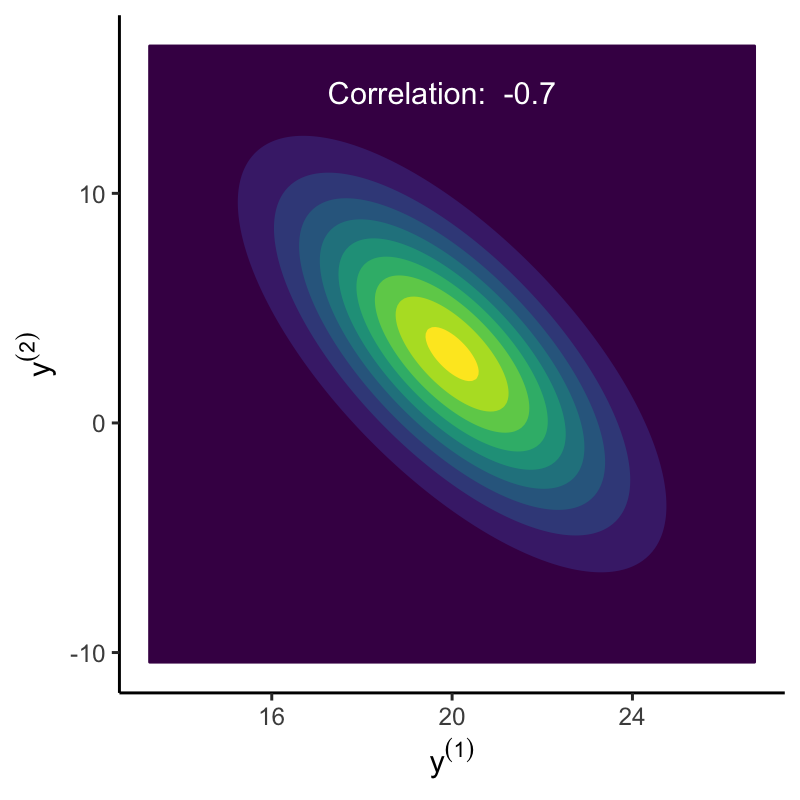

In [104]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)

mean_plot <- c(20, 3)
cov_matrix_plot <- matrix(c(5, -7, -7, 20), nrow = 2)
correlation <- cov_matrix_plot[1, 2] / sqrt(cov_matrix_plot[1, 1] * cov_matrix_plot[2, 2])

y_1_mesh <- seq(mean_plot[1] - 3 * sqrt(cov_matrix_plot[1, 1]), mean_plot[1] + 3 * sqrt(cov_matrix_plot[1, 1]), length.out = 200)
y_2_mesh <- seq(mean_plot[2] - 3 * sqrt(cov_matrix_plot[2, 2]), mean_plot[2] + 3 * sqrt(cov_matrix_plot[2, 2]), length.out = 200)

# y_1_mesh <- seq(0, 50, length.out = 200)
# y_2_mesh <- seq(-25, 25, length.out = 200)

bvn_plot <- function(y_1, y_2) (matthews_dbvnorm(matrix(c(y_1, y_2), ncol = 2), mean_plot, cov_matrix_plot))
z_bvn <- outer(y_1_mesh, y_2_mesh, bvn_plot)

rownames(z_bvn) <- y_1_mesh
colnames(z_bvn) <- y_2_mesh

as.data.frame(z_bvn) %>% # these %>% are "pipes" from the package magrittr
  rownames_to_column(var = "row") %>% # they allow you to compose functions
  gather(col, value, -row) %>%
  mutate(row = as.numeric(row),
         col = as.numeric(col)) %>%
ggplot(aes(row, col, z = value, color = after_stat(level))) +
  geom_contour_filled(bins = 10, show.legend = FALSE) +
   theme_classic() + xlab(expression(y^{(1)})) + ylab(expression(y^{(2)})) +
   annotate("text", x = Inf, y = Inf, hjust = 2, vjust = 4,
                 label = paste("Correlation: ", round(correlation, digits = 4)), color="white")
print(cov_matrix_plot)

### Defining the Likelihood

Now that we have defined the bivariate normal density function, we can easily implement the likelihood function. Recall that, assuming IID observations $y_i$, the likelihood will take the form

$$ p(\underline{y}|\mu, \Sigma_{true}) = \prod_{i=1}^n  p(y_i|\mu, \Sigma_{true}) = \prod_{i=1}^n  \frac{1}{\sqrt{(2\pi)^2 |\Sigma_{true}| }} \exp\left\{-\frac{1}{2}\left(y_i - \underline{\mu}\right)^\top \Sigma_{true}^{-1}\left(y_i - \underline{\mu}\right)\right\}. $$

We again implement this as a log-likelihood:

In [94]:
dlikelihood_bvn <- function(mean_vector, y, log = FALSE) {
    log_pdf_evals <- matthews_dbvnorm(y, mean_vector, true_cov_matrix, log = TRUE)
    output <- sum(log_pdf_evals)

    if (log == TRUE) {
        return(output)
    }
    else{
        return(exp(output))
    }
}

# The following function allows us to evaluate the log-likelihood for
# many mean and variance pairs at one. This is achieved by repeatedly
# applying log_likelihood_normal on each (mean, standard_deviation) pair.
# We use the apply() function, you could also just use a for-loop.

dlikelihood_bvn_vectorised <- function(mean_matrix, y, log = FALSE) {
    output <- apply(mean_matrix, 1, function(mean_vector) dlikelihood_bvn(mean_vector, y, log = log))
    return(output)
}

### Defining the Prior

A [conjugate prior](https://en.wikipedia.org/wiki/Conjugate_prior#Table_of_conjugate_distributions) of the mean vector of a bivariate normal distribution with known covariance matrix is again a bivariate normal distribution. That is,

$$ \underline{\mu} \sim \text{MultivariateNormal}(\mu_{0}, \Sigma_{0}), $$

where $\mu_{0} = (\mu_{0}^{(1)},\mu_{0}^{(2)})^\top$ and $\Sigma_{0}$ is a $2\times 2$ covariance matrix.

Since we have already implemented the density of a bivariate normal distribution, implementing the prior is easy:

In [95]:
dprior_bvn <- function(mean_vector, prior_params, log = FALSE) {
    prior_mean_vector <- prior_params$mean_vector
    prior_cov_matrix <- prior_params$cov_matrix

    output <- matthews_dbvnorm(mean_vector, prior_mean_vector, prior_cov_matrix, log = log)
    return(output)
}

Here, ``prior_params`` is an ``R`` list with attribute names ``mean_vector`` and ``cov_matrix`` which correspond to the values $\mu_{0}$ and $\Sigma_{0}$ respectively.

### The Bayesian Update

Since we used a conjugate prior, the posterior should be in the same family as the prior and we just need to update the parameter values. That is, 

$$\underline{\mu} | \underline{y}  \sim \text{MultivariateNormal}(\mu_0', \Sigma_0'),$$

 where $\mu_0'$ and $\Sigma_0'$ are the updated parameters.

However, since we have the prior and likelihood implemented, we will first implement the *unnormalised* posterior density, as we did before:

#### Unnormalised Posterior Density

In [96]:
dposterior_bvn_unnormalised <- function(mean_vector, y_data, prior_params, log = FALSE) {
    log_prior <- dprior_bvn(mean_vector, prior_params, log = TRUE)
    log_likelihood <- dlikelihood_bvn_vectorised(mean_vector, y_data, log = TRUE)
    output <- log_prior + log_likelihood
    if (log == TRUE) {
        return(output)
    }
    else{
        return(exp(output))
    }
}

#### Normalised Posterior Density

From the table of [conjugate priors](https://en.wikipedia.org/wiki/Conjugate_prior#Table_of_conjugate_distributions), the parameter values are updated as follows:

$$ \mu_0' = (\Sigma_0^{-1} + n\Sigma_{true}^{-1})^{-1}(\Sigma_0^{-1}\mu_0 + n \Sigma_{true}^{-1}\bar{\underline{y}}), $$
$$ \Sigma_0' = (\Sigma_0^{-1} + n\Sigma_{true}^{-1})^{-1}, $$

where $\bar{\underline{y}} = \left(\frac{1}{n}\sum_{i=1}^n y^{(1)}_i , \frac{1}{n}\sum_{i=1}^n y^{(2)}_i \right)^\top$ is the sample mean *vector* of the data $\underline{y}$.

In [97]:
dposterior_bvn <- function(means, y_data, prior_params, log = FALSE) {
    prior_mean_vector <- prior_params$mean_vector
    prior_cov_matrix <- prior_params$cov_matrix

    mean_y_data <- colMeans(y_bvn_data) # the mean vector of the data
    n <- nrow(y_data) # number of data

    inv_true_cov_matrix <- solve(true_cov_matrix)
    inv_prior_cov_matrix <- solve(prior_cov_matrix)

    mean_vector_updated <- solve(inv_prior_cov_matrix + n * inv_true_cov_matrix) %*%
                           (inv_prior_cov_matrix %*% prior_mean_vector + n * inv_true_cov_matrix %*% mean_y_data)
    cov_matrix_updated <- solve(inv_prior_cov_matrix + n * inv_true_cov_matrix)

    posterior_params <- list(mean_vector = c(mean_vector_updated), cov_matrix = cov_matrix_updated)

    output <- dprior_bvn(means, posterior_params, log = log)
    return(output)
}

### Plotting the Likelihood, Prior and Posterior:

Let's vary the data used and the prior parameters to see how the likelihood, prior and posterior change:

In [101]:
# data generating process
true_mean_vector <- c(2, 3)
true_cov_matrix <- matrix(c(2, 1.5, 1.5, 2), nrow = 2)

n_bvn_samples <- 15
y_bvn_data <- mvrnorm(n_bvn_samples, true_mean_vector, true_cov_matrix)

# prior params
prior_mean <- c(1, 1)
prior_cov_matrix <- 5 * matrix(c(2, 1, 1, 1), nrow = 2)

prior_params <- list(mean_vector = prior_mean, cov_matrix = prior_cov_matrix)

Plotting:

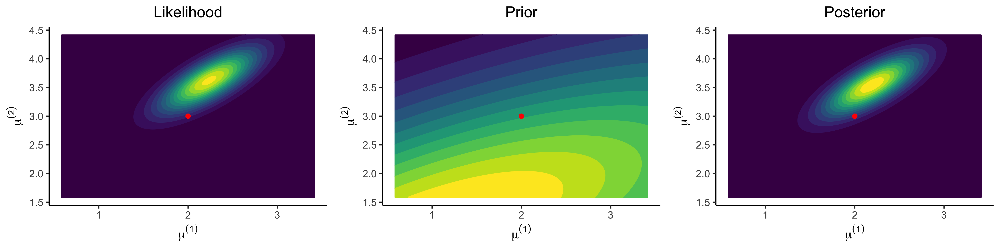

In [102]:
options(repr.plot.width = 12, repr.plot.height = 3, repr.plot.res = 400)

mu_1_mesh <- seq(true_mean_vector[1] - 1 * sqrt(true_cov_matrix[1, 1]), true_mean_vector[1] + 1 * sqrt(true_cov_matrix[1, 1]), length.out = 200)
mu_2_mesh <- seq(true_mean_vector[2] - 1 * sqrt(true_cov_matrix[2, 2]), true_mean_vector[2] + 1 * sqrt(true_cov_matrix[2, 2]), length.out = 200)

bvn_likelihood_plot <- function(y_1, y_2) (dlikelihood_bvn_vectorised(matrix(c(y_1, y_2), ncol = 2), y_bvn_data))
z_likelihood_bvn <- outer(mu_1_mesh, mu_2_mesh, bvn_likelihood_plot)

bvn_prior_plot <- function(y_1, y_2) (dprior_bvn(matrix(c(y_1, y_2), ncol = 2), prior_params))
z_prior_bvn <- outer(mu_1_mesh, mu_2_mesh, bvn_prior_plot)

bvn_posterior_plot <- function(y_1, y_2) (dposterior_bvn(matrix(c(y_1, y_2), ncol = 2), y_bvn_data, prior_params))
z_posterior_bvn <- outer(mu_1_mesh, mu_2_mesh, bvn_posterior_plot)

rownames(z_likelihood_bvn) <- mu_1_mesh
colnames(z_likelihood_bvn) <- mu_2_mesh
rownames(z_prior_bvn) <- mu_1_mesh
colnames(z_prior_bvn) <- mu_2_mesh
rownames(z_posterior_bvn) <- mu_1_mesh
colnames(z_posterior_bvn) <- mu_2_mesh

likelihood_bvn_plot <- as.data.frame(z_likelihood_bvn) %>% # these %>% are "pipes" from the package magrittr
    rownames_to_column(var = "row") %>% # they allow you to compose functions
    gather(col, value, -row) %>%
    mutate(row = as.numeric(row),
          col = as.numeric(col)) %>%
  ggplot() +
    geom_contour_filled(aes(row, col, z = value, color = after_stat(level)), bins = 15, show.legend = FALSE) +
    theme_classic() + xlab(expression(mu^{(1)})) + ylab(expression(mu^{(2)})) +
    ggtitle("Likelihood") + theme(plot.title = element_text(hjust = 0.5)) +
    geom_point(data = data.frame(x = c(true_mean_vector[1]), y = c(true_mean_vector[2])), aes(x = x, y = y), color = "red")
  
prior_bvn_plot <- as.data.frame(z_prior_bvn) %>% # these %>% are "pipes" from the package magrittr
    rownames_to_column(var = "row") %>% # they allow you to compose functions
    gather(col, value, -row) %>%
    mutate(row = as.numeric(row),
          col = as.numeric(col)) %>%
  ggplot() +
    geom_contour_filled(aes(row, col, z = value, color = after_stat(level)), bins = 15, show.legend = FALSE) +
    theme_classic() + xlab(expression(mu^{(1)})) + ylab(expression(mu^{(2)})) +
    ggtitle("Prior") + theme(plot.title = element_text(hjust = 0.5)) +
    geom_point(data = data.frame(x = c(true_mean_vector[1]), y = c(true_mean_vector[2])), aes(x = x, y = y), color = "red")

posterior_bvn_plot <- as.data.frame(z_posterior_bvn) %>% # these %>% are "pipes" from the package magrittr
    rownames_to_column(var = "row") %>% # they allow you to compose functions
    gather(col, value, -row) %>%
    mutate(row = as.numeric(row),
          col = as.numeric(col)) %>%
  ggplot() +
    geom_contour_filled(aes(row, col, z = value, color = after_stat(level)), bins = 15, show.legend = FALSE) +
    theme_classic() + xlab(expression(mu^{(1)})) + ylab(expression(mu^{(2)})) +
    ggtitle("Posterior") + theme(plot.title = element_text(hjust = 0.5)) + 
    geom_point(data = data.frame(x = c(true_mean_vector[1]), y = c(true_mean_vector[2])), aes(x = x, y = y), color = "red")
  
# plot_grid is a function from the R package cowplot
plot_grid(likelihood_bvn_plot, prior_bvn_plot, posterior_bvn_plot, nrow = 1)

Now with the unnormalised posterior:

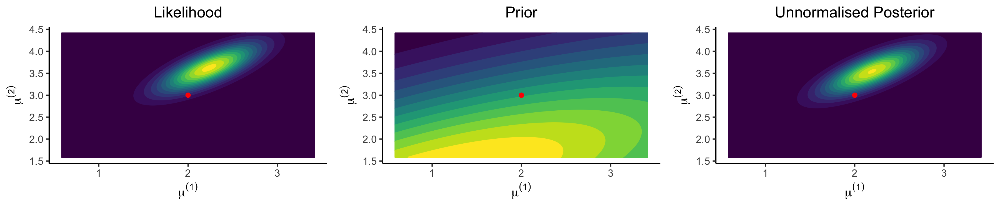

In [103]:
options(repr.plot.width = 12, repr.plot.height = 2.5, repr.plot.res = 300)

mu_1_mesh <- seq(true_mean_vector[1] - 1 * sqrt(true_cov_matrix[1, 1]), true_mean_vector[1] + 1 * sqrt(true_cov_matrix[1, 1]), length.out = 200)
mu_2_mesh <- seq(true_mean_vector[2] - 1 * sqrt(true_cov_matrix[2, 2]), true_mean_vector[2] + 1 * sqrt(true_cov_matrix[2, 2]), length.out = 200)

bvn_likelihood_plot <- function(y_1, y_2) (dlikelihood_bvn_vectorised(matrix(c(y_1, y_2), ncol = 2), y_bvn_data))
z_likelihood_bvn <- outer(mu_1_mesh, mu_2_mesh, bvn_likelihood_plot)

bvn_prior_plot <- function(y_1, y_2) (dprior_bvn(matrix(c(y_1, y_2), ncol = 2), prior_params))
z_prior_bvn <- outer(mu_1_mesh, mu_2_mesh, bvn_prior_plot)

bvn_posterior_unnormalised_plot <- function(y_1, y_2) (dposterior_bvn_unnormalised(matrix(c(y_1, y_2), ncol = 2), y_bvn_data, prior_params))
z_posterior_bvn <- outer(mu_1_mesh, mu_2_mesh, bvn_posterior_unnormalised_plot)

rownames(z_likelihood_bvn) <- mu_1_mesh
colnames(z_likelihood_bvn) <- mu_2_mesh
rownames(z_prior_bvn) <- mu_1_mesh
colnames(z_prior_bvn) <- mu_2_mesh
rownames(z_posterior_bvn) <- mu_1_mesh
colnames(z_posterior_bvn) <- mu_2_mesh

likelihood_bvn_plot <- as.data.frame(z_likelihood_bvn) %>% # these %>% are "pipes" from the package magrittr
    rownames_to_column(var = "row") %>% # they allow you to compose functions
    gather(col, value, -row) %>%
    mutate(row = as.numeric(row),
          col = as.numeric(col)) %>%
  ggplot() +
    geom_contour_filled(aes(row, col, z = value, color = after_stat(level)), bins = 15, show.legend = FALSE) +
    theme_classic() + xlab(expression(mu^{(1)})) + ylab(expression(mu^{(2)})) +
    ggtitle("Likelihood") + theme(plot.title = element_text(hjust = 0.5)) +
    geom_point(data = data.frame(x = c(true_mean_vector[1]), y = c(true_mean_vector[2])), aes(x = x, y = y), color = "red")
  
prior_bvn_plot <- as.data.frame(z_prior_bvn) %>% # these %>% are "pipes" from the package magrittr
    rownames_to_column(var = "row") %>% # they allow you to compose functions
    gather(col, value, -row) %>%
    mutate(row = as.numeric(row),
          col = as.numeric(col)) %>%
  ggplot() +
    geom_contour_filled(aes(row, col, z = value, color = after_stat(level)), bins = 15, show.legend = FALSE) +
    theme_classic() + xlab(expression(mu^{(1)})) + ylab(expression(mu^{(2)})) +
    ggtitle("Prior") + theme(plot.title = element_text(hjust = 0.5)) +
    geom_point(data = data.frame(x = c(true_mean_vector[1]), y = c(true_mean_vector[2])), aes(x = x, y = y), color = "red")

posterior_bvn_plot <- as.data.frame(z_posterior_bvn) %>% # these %>% are "pipes" from the package magrittr
    rownames_to_column(var = "row") %>% # they allow you to compose functions
    gather(col, value, -row) %>%
    mutate(row = as.numeric(row),
          col = as.numeric(col)) %>%
  ggplot() +
    geom_contour_filled(aes(row, col, z = value, color = after_stat(level)), bins = 15, show.legend = FALSE) +
    theme_classic() + xlab(expression(mu^{(1)})) + ylab(expression(mu^{(2)})) +
    ggtitle("Unnormalised Posterior") + theme(plot.title = element_text(hjust = 0.5)) + 
    geom_point(data = data.frame(x = c(true_mean_vector[1]), y = c(true_mean_vector[2])), aes(x = x, y = y), color = "red")
  
# plot_grid is a function from the R package cowplot
plot_grid(likelihood_bvn_plot, prior_bvn_plot, posterior_bvn_plot, nrow = 1)